# Classification des textes

L'objectif de ce projet est de construire un modèle de classification de critiques de films en français selon leur tonalité, qu'elle soit positive ou négative. Pour ce faire, nous disposons d'un ensemble de données comprenant 100 000 critiques positives et 100 000 critiques négatives extraites du site allocine.fr sur la période de 2006 à 2020. Le jeu de données est divisé en ensembles d'entraînement (160 000 critiques), de validation (20 000 critiques) et de test (20 000 critiques)

##Import libraries

In [ ]:
import pandas as pd
import numpy as np
import re
from nltk.corpus import stopwords
from numpy import array
import nltk
from collections import Counter
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import LabelEncoder

import warnings
warnings.filterwarnings('ignore')

from tensorflow.keras.preprocessing.text import Tokenizer
from tensorflow.keras.preprocessing.sequence import pad_sequences
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Embedding, Dense, LSTM, GlobalMaxPooling1D, MaxPooling1D, Dropout, Conv1D, Flatten, Bidirectional
import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.preprocessing.sequence import pad_sequences

import nltk
from nltk.corpus import stopwords
from nltk.tokenize import word_tokenize
from nltk.stem import WordNetLemmatizer
import string

from sklearn.model_selection import train_test_split
from sklearn.feature_extraction.text import CountVectorizer, TfidfVectorizer
from sklearn.naive_bayes import MultinomialNB
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import accuracy_score, classification_report

In [ ]:
from google.colab import drive
drive.mount('/content/drive')
!ls

Mounted at /content/drive
drive  sample_data


## Load Dataset

In [ ]:
!pip install datasets


     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 510.5/510.5 kB 3.5 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 116.3/116.3 kB 11.6 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 194.1/194.1 kB 19.2 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 134.8/134.8 kB 14.4 MB/s eta 0:00:00


In [ ]:
from datasets import load_dataset

In [ ]:
dataset = load_dataset("allocine")

Generating train split:   0%|          | 0/160000 [00:00<?, ? examples/s]

Generating validation split:   0%|          | 0/20000 [00:00<?, ? examples/s]

Generating test split:   0%|          | 0/20000 [00:00<?, ? examples/s]

## Data processing

In [ ]:
# Accéder aux ensembles d'entraînement, de validation et de test
train_dataset = dataset['train']
valid_dataset = dataset['validation']
test_dataset = dataset['test']


In [ ]:
# Accéder aux critiques et aux labels
train_reviews = train_dataset['review']
train_labels = train_dataset['label']

In [ ]:
train_reviews[:2]

['Si vous cherchez du cinéma abrutissant à tous les étages,n\'ayant aucune peur du cliché en castagnettes et moralement douteux,"From Paris with love" est fait pour vous.Toutes les productions Besson,via sa filière EuropaCorp ont de quoi faire naître la moquerie.Paris y est encore une fois montrée comme une capitale exotique,mais attention si l\'on se dirige vers la banlieue,on y trouve tout plein d\'intégristes musulmans prêts à faire sauter le caisson d\'une ambassadrice américaine.Nauséeux.Alors on se dit qu\'on va au moins pouvoir apprécier la déconnade d\'un classique buddy-movie avec le jeune agent aux dents longues obligé de faire équipe avec un vieux lou complètement timbré.Mais d\'un côté,on a un Jonathan Rhys-meyers fayot au possible,et de l\'autre un John Travolta en total délire narcissico-badass,crâne rasé et bouc proéminent à l\'appui.Sinon,il n\'y a aucun scénario.Seulement,des poursuites débiles sur l\'autoroute,Travolta qui étale 10 mecs à l\'arme blanche en 8 mouvemen

In [ ]:
# Convertir train_reviews en DataFrame
df_train_reviews = pd.DataFrame(train_reviews, columns=['review'])

# Convertir train_dataset en DataFrame
df_train_labels = pd.DataFrame(train_dataset['label'], columns=['label'])

# Concaténer les deux DataFrames
df_train = pd.concat([df_train_reviews, df_train_labels], axis=1)


In [ ]:
# Convertir test_reviews en DataFrame
test_reviews = test_dataset['review']
df_test_reviews = pd.DataFrame(test_reviews, columns=['review'])

# Convertir test_dataset en DataFrame
test_labels = test_dataset['label']
df_test_labels = pd.DataFrame(test_labels, columns=['label'])

# Concaténer les deux DataFrames
df_test = pd.concat([df_test_reviews, df_test_labels], axis=1)


In [ ]:
# Convertir les validation en DataFrame
valid_reviews = valid_dataset['review']
df_valid_reviews = pd.DataFrame(valid_reviews, columns=['review'])

# Convertir valid_dataset['label'] en DataFrame
valid_labels = valid_dataset['label']
df_valid_labels = pd.DataFrame(valid_labels, columns=['label'])
# Concaténer les deux DataFrames
df_val = pd.concat([df_valid_reviews, df_valid_labels], axis=1)

In [ ]:
#differentes notes dans notre dataset
df_train_labels.label.unique()

array([0, 1])

In [ ]:
df_train.head()

,review,label
0,Si vous cherchez du cinéma abrutissant à tous ...,0
1,"Trash, re-trash et re-re-trash...! Une horreur...",0
2,"Et si, dans les 5 premières minutes du film, l...",0
3,Mon dieu ! Quelle métaphore filée ! Je suis ab...,0
4,"Premier film de la saga Kozure Okami, ""Le Sabr...",1


##Data cleaning

In [ ]:
# Téléchargement des ressources nécessaires pour NLTK
nltk.download('punkt')
nltk.download('stopwords')
nltk.download('wordnet')

[nltk_data] Downloading package punkt to /root/nltk_data...
[nltk_data]   Unzipping tokenizers/punkt.zip.
[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Unzipping corpora/stopwords.zip.
[nltk_data] Downloading package wordnet to /root/nltk_data...


True

In [ ]:
from bs4 import BeautifulSoup
from nltk.tokenize import word_tokenize
from nltk.corpus import stopwords
from nltk.stem import WordNetLemmatizer
import re

def text_to_words(text):
    # supprimer des liens hypertextes
    text = re.sub(r"http[s]?://(?:[a-zA-Z]|[0-9]|[$-_@.&+]|[!*\(\),]|(?:%[0-9a-fA-F][0-9a-fA-F]))+", " ", text)
    # supprimer des balises html
    text = BeautifulSoup(text, "lxml").get_text()
    # remplacer les caractères autres que des lettres par des espaces
    text = re.sub("[^a-zA-Z]", " ", text)

    return text

def preprocess_text(text, stopwords=None):
    # Tokenisation
    tokens = word_tokenize(text, language='french')

    # Suppression de la ponctuation et des caractères spéciaux
    tokens = [word.lower() for word in tokens if word.isalnum()]

    # Suppression des mots vides (stopwords)
    if stopwords is not None:
        stop_words = set(stopwords.words('french'))
        tokens = [word for word in tokens if not word in stop_words]

    # Lemmatisation
    lemmatizer = WordNetLemmatizer() # French doesn't have built-in lemmatizer in NLTK
    tokens = [lemmatizer.lemmatize(word) for word in tokens]

    # Reconstitution du texte prétraité
    preprocessed_text = ' '.join(tokens)

    return preprocessed_text


In [ ]:
# 1. Prétraiter les données
df_train['preprocessed_text'] = df_train['review'].apply(preprocess_text)
df_test['preprocessed_text'] = df_test['review'].apply(preprocess_text)
df_val['preprocessed_text'] = df_val['review'].apply(preprocess_text)

In [ ]:
df_train.head()

,review,label,preprocessed_text
0,Si vous cherchez du cinéma abrutissant à tous ...,0,si vous cherchez du cinéma abrutissant à tous ...
1,"Trash, re-trash et re-re-trash...! Une horreur...",0,trash et une horreur sans nom le 20 premières ...
2,"Et si, dans les 5 premières minutes du film, l...",0,et si dans le 5 premières minute du film la pa...
3,Mon dieu ! Quelle métaphore filée ! Je suis ab...,0,mon dieu quelle métaphore filée je suis abasou...
4,"Premier film de la saga Kozure Okami, ""Le Sabr...",1,premier film de la saga kozure okami le sabre ...


In [ ]:
df_train['preprocessed_text']

0         si vous cherchez du cinéma abrutissant à tous ...
1         trash et une horreur sans nom le 20 premières ...
2         et si dans le 5 premières minute du film la pa...
3         mon dieu quelle métaphore filée je suis abasou...
4         premier film de la saga kozure okami le sabre ...
                                ...                        
159995    un rythme bien trop lent et un ashton kutcher ...
159996    monsieur duchovny vous êtes aussi piètre acteu...
159997    complètement différent de film de la série con...
159998    alors franchement pour le moment le meilleur f...
159999    beur sur la ville réunit à lui même toutes le ...
Name: preprocessed_text, Length: 160000, dtype: object

###  baseline

In [ ]:
# Convertir les textes en représentations vectorielles
count_vectorizer = CountVectorizer()
X_train_counts = count_vectorizer.fit_transform(df_train['preprocessed_text'])
X_test_counts = count_vectorizer.transform(df_test['preprocessed_text'])


####bag-of-words

In [ ]:
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import accuracy_score, classification_report

# Initialiser et entraîner le modèle de forêt aléatoire
rf_classifier_bow = RandomForestClassifier(n_estimators=100, random_state=42)
rf_classifier_bow.fit(X_train_counts, df_train['label'])

# Faire des prédictions sur l'ensemble de test
rf_predictions_bow = rf_classifier_bow.predict(X_test_counts)

# Évaluer les performances du modèle


accuracy = accuracy_score(df_test['label'], rf_predictions_bow)
print("Accuracy:", accuracy)

print("Classification Report:")
print(classification_report(df_test['label'], rf_predictions_bow))


Accuracy: 0.8966
Classification Report:
              precision    recall  f1-score   support

           0       0.90      0.90      0.90     10408
           1       0.90      0.89      0.89      9592

    accuracy                           0.90     20000
   macro avg       0.90      0.90      0.90     20000
weighted avg       0.90      0.90      0.90     20000



In [ ]:
# Régression logistique avec BoW
lr_classifier_bow = LogisticRegression()
lr_classifier_bow.fit(X_train_counts, df_train['label'])
lr_predictions_bow = lr_classifier_bow.predict(X_test_counts)

print("Régression logistique avec Bag-of-Words :")
print("Accuracy:", accuracy_score(df_test['label'], lr_predictions_bow))
print("Classification Report:")
print(classification_report(df_test['label'], lr_predictions_bow))



Régression logistique avec Bag-of-Words :
Accuracy: 0.91865
Classification Report:
              precision    recall  f1-score   support

           0       0.92      0.92      0.92     10408
           1       0.91      0.92      0.92      9592

    accuracy                           0.92     20000
   macro avg       0.92      0.92      0.92     20000
weighted avg       0.92      0.92      0.92     20000



Le bag-of-word avec le random forestre et la régression logistique donne Accuracy globale respectivement 0.89 et  0.99 , ce qui signifie que le modèle a correctement prédit la classe de près de 90% des échantillons de l’ensemble de test.

Le modèle semble performant et équilibré en termes de précision, de rappel et de score F1, avec une légère tendance à mieux prédire la classe négative . Cependant il serait judicieux de le tester sur un ensemble de validation supplémentaire ou d’utiliser la validation croisée pour évaluer sa performance sur différentes partitions de l’ensemble de données.

####TF-IDF

In [ ]:
# TF-IDF
tfidf_vectorizer = TfidfVectorizer()
X_train_tfidf = tfidf_vectorizer.fit_transform(df_train['preprocessed_text'])
X_test_tfidf = tfidf_vectorizer.transform(df_test['preprocessed_text'])

# Régression logistique avec TF-IDF
lr_classifier_tfidf = LogisticRegression()
lr_classifier_tfidf.fit(X_train_tfidf, df_train['label'])
lr_predictions_tfidf = lr_classifier_tfidf.predict(X_test_tfidf)


print("Régression logistique avec TF-IDF :")
print("Accuracy:", accuracy_score(df_test['label'], lr_predictions_tfidf))
print("Classification Report:")
print(classification_report(df_test['label'], lr_predictions_tfidf))

Régression logistique avec TF-IDF :
Accuracy: 0.92385
Classification Report:
              precision    recall  f1-score   support

           0       0.93      0.92      0.93     10408
           1       0.92      0.92      0.92      9592

    accuracy                           0.92     20000
   macro avg       0.92      0.92      0.92     20000
weighted avg       0.92      0.92      0.92     20000



In [ ]:
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import accuracy_score, classification_report
# Random forest avec TF-IDF
nb_classifier_tfidf = RandomForestClassifier(n_estimators=100, random_state=42)
nb_classifier_tfidf.fit(X_train_tfidf, df_train['label'])
nb_predictions_tfidf = nb_classifier_tfidf.predict(X_test_tfidf)

print("Random forest avec TF-IDF :")
print("Accuracy:", accuracy_score(df_test['label'], nb_predictions_tfidf))
print("Classification Report:")
print(classification_report(df_test['label'], nb_predictions_tfidf))

Random forest avec TF-IDF :
Accuracy: 0.88425
Classification Report:
              precision    recall  f1-score   support

           0       0.88      0.90      0.89     10408
           1       0.89      0.86      0.88      9592

    accuracy                           0.88     20000
   macro avg       0.88      0.88      0.88     20000
weighted avg       0.88      0.88      0.88     20000



Les modèles classiques de classification

In [ ]:
pip install gensim

In [ ]:
from gensim.models import KeyedVectors
model = KeyedVectors.load_word2vec_format('/content/frWac_non_lem_no_postag_no_phrase_200_cbow_cut100.bin', binary=True, unicode_errors="ignore")

In [ ]:
def encode_text(text, model):
    word_vectors = []
    for word in text.split():
        if word in model:
            word_vectors.append(model[word])
    if len(word_vectors) > 0:
        return np.mean(word_vectors, axis=0)
    else:
        return np.zeros(model.vector_size)

# Itérer sur les valeurs de la colonne 'preprocessed_text'
encoded_texts = []
for text in df_train['preprocessed_text']:
    encoded_texts.append(encode_text(text, model))


In [ ]:
# Afficher les vecteurs encodés
for encoded_text in encoded_texts:
    print("Vecteur encodé:", encoded_text)


Streaming output truncated to the last 5000 lines.
 -3.80259417e-02  7.51216859e-02  1.57485101e-02 -1.49217010e-01
  9.14581567e-02 -2.77519315e-01  3.24688852e-02  6.07373677e-02
  4.46321769e-03 -1.11173190e-01  3.62617970e-02  5.15458398e-02
  1.11180723e-01  3.76348309e-02  2.28094473e-01  4.11943793e-02
 -3.00590247e-02 -1.66849002e-01 -6.95426613e-02  4.95527275e-02
 -1.96181417e-01 -2.98294686e-02  1.06102288e-01 -5.47030903e-02
 -1.92306545e-02 -3.01311128e-02  1.48912340e-01  1.07400469e-01
  2.37486158e-02 -5.56732202e-03  1.32762581e-01 -7.89520424e-03
  2.45988056e-01 -2.38308646e-02  7.09591731e-02 -3.75806866e-03
 -1.75216869e-01 -9.82299373e-02  8.94911736e-02 -3.50139961e-02
 -9.95173901e-02 -8.34951401e-02 -6.23624586e-02 -4.57821880e-03
  1.22004800e-01 -6.27168864e-02  2.74557620e-02  1.87692195e-02
 -4.62692380e-02  2.85396911e-02  6.92336485e-02  3.35487910e-02
  2.14986682e-01  2.52736866e-01 -6.78148419e-02  3.60887535e-02
 -1.38464078e-01  1.13270432e-03  1.009

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



Streaming output truncated to the last 5000 lines.
  1.22250199e-01  3.09727460e-01 -3.21244597e-01  5.99251807e-01
 -4.86314297e-03 -4.74029221e-02 -2.65192926e-01 -2.67425310e-02
  1.50930032e-01 -3.01168561e-01  1.05314419e-01  1.56907454e-01
 -3.39475572e-01 -2.74707079e-01  8.65755230e-02 -1.67772025e-01
  5.74724225e-04  1.06224939e-01  4.15530413e-01 -1.70038983e-01
 -1.86038449e-01 -2.43012235e-01 -6.12127781e-02  2.07758680e-01
 -1.38794184e-01 -2.12198004e-01  3.93912680e-02  2.44291767e-01
 -3.78522277e-01  3.12658250e-01  3.29768747e-01  3.17735001e-02
  1.50951147e-02 -2.86886394e-01 -3.88027802e-02  1.67298317e-01
 -5.29599935e-02 -1.03212722e-01  1.18365504e-01 -1.56948626e-01
 -1.97075978e-01  2.37638608e-01  5.77318184e-02  2.61418045e-01
  4.85030949e-01  4.88419712e-01  2.68386006e-01  7.68920705e-02
  3.64901036e-01 -1.48189723e-01 -1.10836670e-01 -5.27393557e-02
 -1.15058832e-01  2.48753250e-01  3.52873087e-01 -1.87654123e-01
 -1.45017460e-01  3.49540502e-01 -2.134

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



Streaming output truncated to the last 5000 lines.
  3.59587511e-03  1.80154964e-02  4.91801947e-02  3.75764146e-02
 -3.60802980e-03 -1.65924951e-01  1.12047881e-01 -5.69840856e-02
  1.15466014e-01 -2.70767987e-01  4.63561192e-02  1.43155055e-02
 -1.13483772e-01 -1.19044274e-01  1.28897220e-01 -1.55038729e-01
  6.96156698e-04  5.15746213e-02 -2.12145653e-02  1.59244075e-01
 -1.36020305e-02  1.00838758e-01  3.14894840e-02  1.59980580e-02
  7.37752244e-02 -1.64336152e-02  2.85169899e-01 -6.99827150e-02
  2.52336524e-02 -5.53916432e-02  3.50872204e-02  3.35530192e-02
  1.66537315e-01  2.30381504e-01  6.30666241e-02 -4.38029505e-02
  2.38917634e-01  1.61664918e-01  4.60048299e-03 -2.45849509e-02
  1.31311849e-01  3.61033082e-02  1.42480642e-01 -1.34436995e-01
  6.05865032e-04 -1.19997419e-01  7.01665357e-02  1.47238925e-01
 -6.19418137e-02  1.06149152e-01 -1.56690553e-01 -7.77204409e-02]
Vecteur encodé: [ 0.13311513  0.22955401 -0.05197886  0.1034788   0.07055472 -0.01676309
 -0.09781492 -

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



Streaming output truncated to the last 5000 lines.
  0.08100703 -0.03094925 -0.04533311 -0.05459699 -0.02676232 -0.01525004
  0.18662795 -0.14615037 -0.12498643  0.03054374 -0.07501104 -0.07626891
  0.14756064 -0.01635713  0.18197037  0.02516161 -0.05508973 -0.00989634
 -0.14894247 -0.01465725  0.06407548 -0.04190142  0.01115257 -0.04284012
  0.0880123  -0.02716155  0.05153421 -0.18332608  0.0591792  -0.03198579
  0.07405405 -0.07026868  0.18268262  0.01362284 -0.02302608 -0.0912478
  0.11797345 -0.04673486 -0.11303981  0.15349926  0.01616557  0.02710979
  0.01136504  0.02095111  0.10071822 -0.00787316  0.09448554 -0.16391203
  0.04916582 -0.03474749 -0.06341314  0.02356131  0.0554556   0.06016133
  0.12962465  0.10987055  0.08133275 -0.00194221  0.24800305  0.03579791
  0.00398839  0.04415667  0.1156709  -0.00321925  0.18404244 -0.00576094
  0.11789366 -0.1022433  -0.05184042  0.10329677 -0.01820764 -0.02432195
 -0.02966294  0.030847  ]
Vecteur encodé: [ 3.97519171e-01  2.42284030e-01

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



Streaming output truncated to the last 5000 lines.
 -0.19037525 -0.1880307  -0.28956565 -0.31019932  0.00127161 -0.09001823
 -0.11586341  0.1491858  -0.05401859  0.05551299 -0.2656213   0.02067969
 -0.07281655  0.1324206  -0.0311796  -0.10486949 -0.05346252 -0.00483124
 -0.26523727 -0.03471064  0.17336084  0.17031245  0.4802862  -0.10631943
 -0.14481224 -0.01151882 -0.40254152  0.06260479 -0.24529098  0.2530195
 -0.26107767 -0.09885959 -0.16317812  0.12416795  0.14259481 -0.21522704
  0.20754088 -0.06656545  0.3020595   0.09404883 -0.13321914 -0.2169587
 -0.02364543  0.02030491  0.05775534  0.43921012  0.11397555 -0.07516701
 -0.08385549  0.15460765 -0.08385717 -0.18492861  0.22150186  0.00454085
 -0.03413915 -0.08905789 -0.26978606 -0.00103383  0.14164801 -0.03115471
  0.01743084 -0.1775671   0.04336195 -0.06745947 -0.27660227 -0.07836156
  0.07461496 -0.21286671 -0.17802596 -0.19389628 -0.14871863  0.14452694
  0.22411239  0.3432942  -0.02435567  0.02907177  0.06948918  0.14055957
 -

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



Streaming output truncated to the last 5000 lines.
  0.19427004  0.09077644  0.2555839   0.07984917  0.14565566 -0.06124626
  0.14388226  0.07195998 -0.2214404  -0.00316097 -0.3012394   0.07513627
  0.19626045  0.01314409  0.01441656  0.01065893 -0.06251372  0.05043749
  0.15213068 -0.18369247 -0.34299597  0.11979028 -0.06933919 -0.03764628
  0.12520994  0.11666559  0.17483154  0.04027778 -0.09188589 -0.08710604
  0.0130396   0.01566448  0.14790133 -0.08444048 -0.06665386  0.047002
  0.19931142  0.04583493  0.1328039  -0.17907457  0.0906474  -0.08891711
  0.11595707 -0.14212397 -0.00620185 -0.04296239  0.05352995 -0.07784162
  0.06698593 -0.06904101 -0.11746167  0.05269661  0.08617371  0.20325954
 -0.04759133  0.11453645 -0.08594895 -0.04345215  0.1003996  -0.08945604
  0.09439647 -0.12169463 -0.02599995 -0.00386923 -0.03291524  0.01532934
  0.14002062  0.26155996  0.11582982 -0.06470444  0.19655521  0.08798379
 -0.08374828 -0.01723943  0.07207006  0.00393071  0.15058082 -0.03634764
  

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



Streaming output truncated to the last 5000 lines.
 -1.79678395e-01  1.59332469e-01 -1.95215456e-02  1.03190430e-01
  1.55889258e-01 -8.62316489e-02 -1.78642184e-01  7.06447735e-02
  6.74848258e-02 -8.53013769e-02 -7.49737769e-02 -2.43556187e-01
 -2.80810237e-01 -2.44939163e-01  6.97182640e-02 -9.52986106e-02
 -8.07608888e-02  1.24649897e-01  8.34341906e-03 -1.13551356e-01
 -1.17568858e-01  8.27182084e-02 -2.32031405e-01  4.52561416e-02
  6.91856518e-02 -1.93627685e-01 -3.80352177e-02  1.12685689e-03
 -2.99818605e-01 -3.09582483e-02  2.92519461e-02  5.13751656e-02
  1.91323474e-01 -5.47521748e-02 -1.25934303e-01  2.62306035e-01
 -1.25960454e-01 -1.61179283e-03  1.57873135e-03  1.87617925e-03
 -1.66109920e-01 -1.64521962e-01 -1.76917017e-01 -9.20347520e-05
 -7.10798427e-02 -1.07940175e-01 -1.07368357e-01 -1.98000781e-02
  1.62330404e-01 -5.66120706e-02 -2.35084578e-01 -1.79375798e-01
  1.45042226e-01  7.25146160e-02 -2.27234252e-02  2.64665604e-01
 -3.49867828e-02 -1.71870477e-02 -4.739

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



Streaming output truncated to the last 5000 lines.
 -0.12770583  0.1108101   0.06399755  0.00697538 -0.00589406  0.29349202
  0.20040262 -0.10945116  0.02096144 -0.11602066 -0.2727072   0.23853318
  0.09314834 -0.01403279 -0.13697104  0.04886283  0.01072078  0.17360309
  0.12473532 -0.0915679  -0.04293949 -0.2326721   0.18043129 -0.00675273
 -0.09714443 -0.11418505  0.0284357  -0.090844   -0.008902   -0.08858791
  0.01389079 -0.01418342  0.43624464  0.3225375   0.0823842   0.2107945
  0.01869567  0.08331014 -0.31891435  0.16362718 -0.21590269  0.09357102
  0.0401191  -0.02420529  0.11854257  0.09302955 -0.1695487   0.18138616
  0.1700693  -0.18177116 -0.33341405  0.12281479  0.14966647 -0.05590494
  0.15231092  0.01390328  0.00564387 -0.24146815 -0.21406674 -0.17746124
 -0.17850338 -0.16649908  0.07233823  0.00632471 -0.11518507  0.09793629
  0.10749136  0.04884534  0.03714605 -0.07598468  0.082784   -0.19990174
  0.08926684 -0.10995589  0.08914642 -0.01831358 -0.12437282 -0.02197138
 

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



Streaming output truncated to the last 5000 lines.
 -6.18461221e-02  6.52045459e-02 -4.26333547e-02 -6.23516627e-02
 -1.70744047e-01 -1.02492526e-01  9.88619030e-02 -8.37089196e-02
 -4.03199568e-02  2.84162551e-01  2.64410730e-02 -2.70885415e-03
  9.63374216e-04 -3.41092497e-02 -1.25763807e-02 -1.17440216e-01
  2.13280469e-02 -2.50002354e-01  1.45816386e-01  5.04679196e-02
 -1.43014684e-01 -4.60336953e-02 -9.83292609e-03  6.85940310e-02
  1.03537805e-01 -1.70642547e-02 -1.08545825e-01  4.70774248e-02
 -1.10502206e-01 -2.54749414e-02 -1.27831578e-01  7.38644227e-02
 -1.20224677e-01 -1.41502041e-02 -1.42034635e-01  2.91947043e-03
 -2.32561808e-02 -4.26643863e-02  4.94059548e-02 -6.29475415e-02
  5.80422021e-02  3.79609726e-02 -1.92399859e-01 -1.75629526e-01
  1.88070297e-01  1.61786765e-01 -1.92168970e-02  2.81078696e-01
 -1.48655018e-02 -1.34760782e-01 -1.56381547e-01 -6.86546322e-03
  5.25269546e-02 -1.66702438e-02  1.52016342e-01 -1.64995119e-01
  2.94589754e-02  1.08268246e-01 -7.918

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



Streaming output truncated to the last 5000 lines.
 -6.34183809e-02 -2.22481117e-01  5.75034209e-02  6.52188510e-02
 -2.52834082e-01 -8.00183639e-02 -1.19908214e-01  6.73981085e-02
  1.03892826e-01 -5.35155386e-02 -1.24101043e-01 -8.72806534e-02
 -1.64732561e-01 -5.96405603e-02 -7.46677741e-02  1.57971770e-01
 -1.83842167e-01  1.58253983e-01 -1.98045060e-01 -3.63329835e-02
 -9.28730592e-02 -9.63028893e-02  1.57997936e-01 -1.05958305e-01
  5.20484149e-02  1.13462299e-01 -8.93754587e-02 -2.58002400e-01
  1.50758848e-01  1.08994566e-01 -4.12111543e-02  2.90811986e-01
  7.37157091e-02 -1.22479118e-01  6.39489759e-03  7.95278996e-02
  1.20361425e-01 -4.88593318e-02  7.79577941e-02  4.76168245e-02
 -9.25974846e-02 -1.28368288e-01 -1.85214356e-01  1.43633112e-01
 -5.33500761e-02  1.05864339e-01  9.05733556e-02 -1.24219537e-01
 -4.85937223e-02 -3.32484320e-02 -1.54285002e-02  8.89261253e-03
 -4.31818925e-02 -7.32893199e-02 -1.33321648e-02 -3.84097584e-02
  1.16758514e-02  2.05816105e-01  1.136

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



Streaming output truncated to the last 5000 lines.
 -1.83796033e-01 -7.91479200e-02  4.55548577e-02  1.10695578e-01
 -1.87951215e-02 -9.46293026e-02 -8.57493207e-02 -5.28249964e-02
 -1.00704886e-01 -1.35045983e-02 -6.28830269e-02  4.04006839e-02
  3.77844512e-01  6.72865212e-02 -7.86479041e-02  9.92828235e-02
  6.70336857e-02 -8.69302601e-02 -4.81524169e-02  1.00227809e-02
 -2.76582867e-01 -1.88526034e-01 -3.47679779e-02 -7.82872364e-02
 -1.03397518e-01  3.05973798e-01 -3.31226848e-02 -5.00417538e-02
  7.45802596e-02  5.45065738e-02 -1.13857657e-01  6.38835039e-03
  4.67028879e-02 -2.05237135e-01  1.50639005e-02 -1.30446265e-02
 -1.66782960e-01 -7.50952289e-02 -6.62315637e-02  8.95103961e-02
  3.98439430e-02 -5.12243584e-02 -1.02787986e-01  7.66292363e-02
 -1.42619908e-01 -8.65485147e-02 -1.09440021e-01  7.44047314e-02
 -2.28888437e-01 -8.08114707e-02 -4.64975238e-02 -1.86050273e-02
 -7.83577636e-02 -9.34148282e-02  1.03096604e-01 -2.44148113e-02
  8.41048211e-02  7.71056116e-02 -1.322

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



Streaming output truncated to the last 5000 lines.
  1.30904779e-01  1.66963845e-01 -1.01069428e-01 -2.92792737e-01
  1.41718879e-01  6.67113513e-02 -1.94906056e-01  4.00030911e-01
  1.42722338e-01  5.87106720e-02 -4.12948996e-01  3.45852003e-02
  3.57844261e-03 -7.69116953e-02  1.94307148e-01  4.09934483e-02
 -1.50088102e-01 -6.31634146e-02 -6.11760095e-02 -3.43395174e-02
 -3.92205976e-02  4.41893637e-02  1.62979111e-01 -8.92813578e-02
  6.44491464e-02 -1.39548317e-01 -2.02602312e-01  1.82338864e-01
 -1.26503140e-01 -9.01462138e-02 -1.15459390e-01  4.89219129e-02
  1.14859929e-02  1.77661002e-01  3.38765502e-01  1.02646820e-01
 -4.40410562e-02 -2.37958759e-01  7.02382997e-02  9.24895853e-02
 -1.84683233e-01  2.66826741e-04 -1.08400397e-01 -1.09490849e-01
 -1.82730183e-01 -1.69945154e-02  4.85709012e-02 -7.69625977e-02
  4.38521922e-01  1.79872066e-01  1.93709135e-01 -1.01587819e-02
  2.01505035e-01 -1.88128725e-02 -3.37988496e-01  4.15210351e-02
 -8.81575271e-02  3.47438827e-03  1.610

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



Streaming output truncated to the last 5000 lines.
  0.10320494  0.12834857 -0.02066722 -0.061515   -0.10014143  0.01253402
 -0.04475576 -0.06406375 -0.07007953 -0.1680872  -0.06634799  0.07122827
 -0.18915622 -0.15595901 -0.1438685   0.11744307  0.00176691  0.04934724
  0.03123457 -0.11240785  0.02042939  0.17932352 -0.1233446   0.07064031
 -0.04703826  0.03798392 -0.08184756  0.05442922  0.1590664   0.05036649
 -0.10099623 -0.03439     0.06265655 -0.26646546 -0.03272837 -0.12833583
 -0.06841653 -0.11563762  0.04816926 -0.06734338  0.00935041 -0.17577544
  0.0196574   0.00171523 -0.10921757  0.18732488  0.09243683 -0.03329664
 -0.04010016 -0.08256188 -0.00907724  0.0007524   0.0189583  -0.28483304
  0.07213146 -0.0899324  -0.02058432  0.09869412 -0.08091932 -0.01687186
  0.19742544 -0.16419439  0.09415742 -0.33816892  0.13699977  0.01648849
 -0.17480512  0.11469718  0.04290036 -0.00964372  0.14482705  0.10284168
 -0.1436175   0.11820456  0.01801388  0.12787306  0.1064215  -0.03167027


IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



Streaming output truncated to the last 5000 lines.
  0.05086396  0.03939646 -0.2858813   0.02715486  0.07330753  0.36798728
  0.35211775 -0.03036779 -0.05240584  0.20662142  0.0374438  -0.02169435
 -0.0433043   0.17223297 -0.24691732 -0.18916968  0.08087711 -0.1935865
 -0.08506805  0.09053589 -0.00799762 -0.12452937  0.27970052  0.02348333
 -0.12573133  0.04026601  0.05100173 -0.30382082 -0.04958966  0.10936718
 -0.10934471 -0.08079357 -0.01649508  0.00274337  0.05211777  0.11084751
 -0.2362563  -0.11327065 -0.33871156 -0.18249401 -0.11192942  0.17359474
 -0.41908517 -0.08274556 -0.18096937 -0.02002866  0.29851943 -0.15152974
  0.41306463  0.04595172  0.09915657  0.11049749 -0.1737303  -0.35966066
  0.10555845  0.2707741  -0.04372887  0.19628051 -0.03163842 -0.03289554
 -0.11449759  0.06334336  0.16069292 -0.05895489  0.29215664  0.01138574
  0.04587865 -0.29335862 -0.20099854  0.2621763  -0.02262184  0.23067802
 -0.00165615 -0.2592666   0.05124719 -0.315816    0.0605068   0.01724639
 

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



Streaming output truncated to the last 5000 lines.
  0.31129894 -0.03914662 -0.22853935  0.05634493 -0.33096185 -0.06316838
  0.16526242 -0.15341002  0.14095366 -0.22922748  0.09510372  0.11996803
 -0.0788573   0.27725902  0.12895674  0.03036169 -0.11266547  0.03823527
 -0.0336914  -0.14777438  0.01890789  0.04221804 -0.02749239  0.17560762
  0.10692661 -0.31734714 -0.03392573  0.00086779 -0.13143477 -0.12031906
 -0.0512668  -0.03878692  0.02497038 -0.23508093 -0.10269727 -0.00475701
  0.02636698  0.06671701 -0.0722006  -0.01413038  0.04527866  0.17202105
 -0.10994028 -0.05632469  0.0840114   0.00953286 -0.02793792 -0.17642412
  0.12011431  0.02806222  0.21646023  0.42513323  0.26615396  0.00948221
 -0.55293536  0.1294631   0.06351573 -0.0835188   0.26292694  0.23184615
 -0.3369008  -0.03272974  0.02753271 -0.05186122 -0.18447585  0.10070886
  0.3939168  -0.2871813   0.36942232 -0.25802293  0.13364379  0.36987668
 -0.04160728  0.06849698 -0.02610817 -0.11320799 -0.006344    0.0349352
 

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



Streaming output truncated to the last 5000 lines.
  0.03181727 -0.12687477  0.12748247 -0.00379423 -0.07770594  0.10572098
  0.11455397  0.12586021  0.10732835 -0.17524259  0.17425871  0.03864603
  0.15628228 -0.0913158  -0.06018443 -0.09727741  0.10856856 -0.11460891
  0.11003181  0.00166724 -0.03172202  0.06458044  0.06604654  0.22477251
 -0.0836264   0.13534947 -0.07281312  0.06392831  0.13876592 -0.16200832
  0.09871545 -0.07781433  0.03875988  0.09426645  0.08766215 -0.05596054
  0.0748445   0.27423263  0.0102229   0.00489266  0.28014892  0.11916234
  0.07277041 -0.0301717   0.04716076 -0.03439352  0.20762378 -0.10359449
 -0.03398407 -0.0403921   0.00417958  0.24674125 -0.08919915 -0.12109178
 -0.09354264 -0.09070472]
Vecteur encodé: [ 2.61053175e-01  3.62959892e-01 -9.90845412e-02 -4.55932952e-02
  1.53613895e-01  1.81270316e-01 -2.84696072e-02  5.31722642e-02
 -2.30654459e-02 -1.52320433e-02 -6.65641502e-02 -7.76934326e-02
 -3.07961434e-01 -1.82673186e-01  8.50423500e-02  1.033

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



Streaming output truncated to the last 5000 lines.
 -0.20773284  0.19297516 -0.30077258 -0.05763876 -0.01277544 -0.13562569
  0.02032056  0.37856838  0.09206837 -0.06102357  0.14420703  0.18051784
  0.2733323  -0.10318995  0.1626028  -0.37891915  0.09957664 -0.2032876
  0.04684295 -0.31260276 -0.32055873 -0.07523336  0.08324064 -0.18202305
  0.01680113  0.3205939   0.1447289  -0.1861434   0.04541226 -0.03648285
 -0.5569659   0.12644473 -0.19524276 -0.25510234 -0.09933435 -0.22966069
  0.3652456   0.08951049  0.15922245  0.23543091 -0.3024783   0.00226953
  0.18859798  0.48996857 -0.04670971  0.3733434   0.00693816 -0.10620299
 -0.60587645  0.20554177  0.626587   -0.08321832  0.46563715 -0.04582969
 -0.33742285 -0.67642474  0.33854347  0.49294993  0.11537422  0.5437228
  0.12099632 -0.2500331   0.03163524 -0.5704196  -0.04220761 -0.03407329
  0.29974636 -0.29194474  0.07003836  0.5760853   0.20045313  0.3164369
  0.47090134  0.01514701  0.18866032 -0.43608242  0.13042696  0.28318352
 -0

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



Streaming output truncated to the last 5000 lines.
  1.49389701e-02  1.44799829e-01 -6.39256686e-02 -2.14491218e-01]
Vecteur encodé: [ 2.55492628e-01  3.08377653e-01 -1.27646606e-02 -1.51094586e-01
  1.04403839e-01 -4.41034511e-02 -5.67219593e-02 -1.83938622e-01
 -2.03310788e-01 -1.70181125e-01  8.26473385e-02  6.22604974e-02
 -1.04836166e-01 -7.11746365e-02 -8.26340076e-03 -7.93294907e-02
 -2.17100590e-01 -4.92160544e-02 -7.17610419e-02 -1.10090710e-01
 -8.13002065e-02 -1.18753100e-02  1.25314146e-01  2.52927542e-02
  2.86849678e-01 -9.42405686e-02 -5.00331223e-02  3.66693288e-01
 -1.02125943e-01  6.31920621e-02 -4.40275371e-02  2.21473217e-01
 -2.21299499e-01 -1.98116466e-01 -1.36014516e-03 -1.89239174e-01
 -2.11055100e-01  8.83488581e-02 -2.63353959e-02 -3.97162102e-02
 -5.74014671e-02  1.65697739e-01 -2.31091648e-01  6.81912452e-02
  1.98738635e-01 -1.46556497e-01 -5.97749464e-02 -8.36185515e-02
 -2.60783345e-01 -1.18075192e-01  7.90303275e-02  1.26896230e-05
  7.95850158e-02 -1.07

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



Streaming output truncated to the last 5000 lines.
  2.14398101e-01 -2.10330293e-01  3.63789164e-02 -6.78171590e-02
  1.95213169e-01 -1.14029936e-01  1.06557943e-01 -8.72954056e-02
  7.75728226e-02 -2.61636794e-01  1.17439538e-01 -7.72978067e-02
 -6.14744239e-02  1.49341136e-01  8.95555764e-02  1.86336756e-01
 -1.57316655e-01 -1.62227862e-02  7.98744559e-02 -4.05111071e-03
  1.13218300e-01 -1.37278095e-01  1.62159681e-01 -8.02945048e-02
 -3.03535424e-02 -1.42042577e-01  4.02477942e-02  1.38751194e-01
  5.22572510e-02  3.43499839e-01 -1.10679064e-02 -7.79308528e-02
  1.40370846e-01  2.03992784e-01  1.41157638e-02  5.37360720e-02
  2.17062365e-02  4.76815030e-02  2.39070520e-01 -9.74964127e-02
  6.19066274e-03 -7.64444247e-02 -2.02838611e-03  1.20438740e-01
 -7.87510574e-02  8.94805044e-03 -1.08546898e-01 -3.01370416e-02]
Vecteur encodé: [ 5.55035233e-01  1.62797183e-01 -2.61822506e-03 -9.25454963e-03
  2.74125431e-02  5.44053540e-02 -1.24082975e-01 -1.16551556e-01
 -7.59923607e-02 -8.27

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



Streaming output truncated to the last 5000 lines.
 -0.13352926 -0.06145247 -0.16208884 -0.02590339 -0.05931026  0.05289132
 -0.08888252  0.00069115 -0.07990654 -0.16100535 -0.14276104 -0.00071394
  0.2348616  -0.00792222  0.09199952  0.08420347 -0.14815092 -0.22034208
  0.06304054  0.16658331  0.09564459  0.04085855 -0.1097651  -0.25023517
  0.07297871 -0.05909336  0.20955193 -0.11370026  0.08550173  0.00398064
 -0.08316538 -0.17639425 -0.05029416  0.12465571 -0.19595979  0.11332605
  0.13993756 -0.07341239 -0.06290751 -0.16677767 -0.089906   -0.09476833
 -0.04169564 -0.16752176  0.02922807 -0.02995039 -0.08569686  0.19366671
  0.00586615  0.00691322  0.12630247 -0.17285158 -0.07665849  0.07751692
  0.20229338  0.1001169   0.09820103 -0.00858843 -0.12907198 -0.07730666
  0.1624567   0.08208717  0.09339667 -0.00578575  0.09518676 -0.20518012
  0.24021044 -0.01317514 -0.24145925 -0.1794013  -0.459408   -0.0481586
  0.16494016 -0.04492015 -0.00218255 -0.11557606 -0.17915413 -0.05928364
 

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



Streaming output truncated to the last 5000 lines.
 -1.40953586e-01 -1.97779581e-01 -4.67078537e-02  1.80001408e-02
 -5.64775094e-02 -2.64282841e-02  2.32357942e-02 -3.70504558e-02
 -2.11220369e-01  3.15096118e-02 -6.77097887e-02  1.62723958e-01
  3.02196443e-01  1.62680782e-02 -2.86605507e-02  1.11806400e-01
 -1.02255531e-02 -9.65867862e-02 -1.90347899e-02 -4.44793850e-02
 -2.65495121e-01 -2.41091624e-01  4.20610756e-02 -4.49700579e-02
 -1.05149008e-01  2.72444904e-01  8.39813240e-03 -5.98936751e-02
  3.48888412e-02  1.00276053e-01 -8.75973701e-02 -9.44341719e-02
  5.12467287e-02 -1.15245253e-01  1.05117485e-01  1.73733514e-02
 -1.40783831e-01  4.76769060e-02 -5.41306399e-02  5.68592250e-02
  1.34791672e-01 -1.94826387e-02 -5.83200045e-02  1.00547604e-01
 -8.55933353e-02 -1.13706090e-01 -2.54320707e-02  1.11721277e-01
 -6.57980964e-02 -9.44361985e-02 -1.04701765e-01 -4.59062196e-02
 -6.07410520e-02 -1.97040841e-01  4.21644785e-02 -1.83141306e-02
  4.97566462e-02  7.62065500e-02 -2.479

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



Streaming output truncated to the last 5000 lines.
  0.17720096  0.09238928  0.0174955  -0.30827165  0.05221459  0.09383577
 -0.08156234 -0.04911904  0.1331269   0.18382554 -0.19671725  0.01177465
  0.0968936   0.17592585  0.06994195  0.21152057  0.21582949 -0.03051083
  0.04487433 -0.06878302 -0.3653864   0.16322753 -0.29865834  0.08544758
  0.12437399  0.00274618 -0.04960752 -0.03760706 -0.15555032  0.09582495
  0.16813986 -0.17129482 -0.38508955  0.03432051  0.02135432  0.0194493
  0.19576891  0.00072488  0.24503286  0.00699975 -0.1427737   0.01282688
 -0.00745298  0.04834151 -0.05009374 -0.0595125  -0.03674908  0.12277216
  0.09644935 -0.1271057   0.09020829 -0.05904078 -0.0017125  -0.001211
  0.14668697 -0.08596224  0.00411065 -0.20497055  0.10749001 -0.135567
  0.01540838 -0.04232741  0.00922786  0.11109376  0.02296479  0.15256797
 -0.08511811 -0.10710019  0.06346916  0.05800742  0.25456983 -0.17945915
  0.13825615 -0.14323397 -0.00225588  0.00475645  0.03073088 -0.0332565
  0.13

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



Streaming output truncated to the last 5000 lines.
 -0.07717249  0.04890353  0.08180294 -0.06509921 -0.04983411  0.04520148
  0.00431724 -0.01471759  0.22138003  0.0346834   0.0006603   0.01618028
  0.08722876  0.13187607 -0.11519819  0.09942534 -0.23591861  0.06169885
  0.06353091 -0.03987905  0.06306725  0.04732977 -0.06427626  0.03470909
  0.0829104  -0.11672335 -0.16876127 -0.03534458 -0.07875466 -0.12368403
  0.10449183  0.00756     0.05015703  0.11492273 -0.02682925 -0.01082127
 -0.06655306 -0.07051152  0.0795257  -0.10760515 -0.03462528  0.00280141
 -0.03492003  0.07494625  0.12128305 -0.1294965  -0.00393164 -0.07050802
  0.07440247 -0.06604356  0.13380764 -0.03477793 -0.05804688 -0.10818796
  0.09962515 -0.14262006  0.00040386  0.1045789  -0.08726789  0.10460315
  0.02205598  0.02897024  0.1145497   0.01819217  0.07820398 -0.21148412
  0.24077459 -0.05325755 -0.01277953  0.01186142 -0.00488217  0.05940955
  0.18086307  0.17230535  0.0331396  -0.08512665  0.23373513  0.01836572


IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



Streaming output truncated to the last 5000 lines.
Vecteur encodé: [ 1.70966238e-01  1.12364106e-01  6.20675161e-02 -3.64135727e-02
 -1.59669548e-01  1.20464817e-01  1.38230816e-01 -9.68484506e-02
  4.94213635e-03 -1.28616588e-02  1.45972416e-01  1.01447336e-01
 -1.83495030e-01 -1.56970203e-01  1.40801579e-01 -3.55374813e-03
  7.51690008e-03 -2.95206886e-02 -7.37417340e-02  3.92423198e-02
 -2.41391450e-01  1.32344966e-03  9.18217301e-02  6.82406723e-02
  2.44353235e-01 -1.58401668e-01  1.12969674e-01  1.75230756e-01
  5.08436784e-02 -1.62478119e-01 -2.19250508e-02  4.12668772e-02
 -2.57208586e-01 -2.53108948e-01  3.08869574e-02 -2.50918185e-03
 -8.82320926e-02  9.41615254e-02 -1.10987676e-02  1.19760379e-01
  4.17410070e-03  8.26012790e-02 -1.99676901e-02 -1.93945169e-01
  1.89874962e-01 -1.96764573e-01  2.60727227e-01  1.08157672e-01
 -2.17577457e-01 -2.33420637e-02 -2.86988094e-02  7.90965371e-03
  5.47342822e-02  9.56323221e-02 -5.04980572e-02  1.80358235e-02
 -1.29722834e-01 -1.777

## Modele training

## LSTM

In [ ]:
# Définir les paramètres du modèle
vocab_size = 10000  # Taille du vocabulaire
embedding_dim = 64  # Dimension de l'embedding
max_length = 200  # Longueur maximale d'une critique
num_classes = 2  # Nombre de classes (positive/négative)


In [ ]:
from keras.preprocessing.text import Tokenizer
from keras.preprocessing.sequence import pad_sequences

# Initialiser le tokenizer
tokenizer = Tokenizer(num_words=vocab_size, oov_token="<OOV>")

# Adapter le tokenizer aux critiques d'entraînement
tokenizer.fit_on_texts(df_train['preprocessed_text'].values)

# Tokeniser les critiques d'entraînement et de test validation
X_train = tokenizer.texts_to_sequences(df_train['preprocessed_text'].values)
X_test = tokenizer.texts_to_sequences(df_test['preprocessed_text'].values)
X_val = tokenizer.texts_to_sequences(df_val['preprocessed_text'].values)

# Remplir les séquences pour qu'elles aient toutes la même longueur
X_train = pad_sequences(X_train, maxlen=max_length, padding='post')
X_test = pad_sequences(X_test, maxlen=max_length, padding='post')
# Remplir les séquences pour qu'elles aient toutes la même longueur
X_val = pad_sequences(X_val, maxlen=max_length, padding='post')




Tokenisation : chaque mot dans une phrase est représenté par son index de mot tokenizer.word_index. Ainsi, une phrase de 4 mots sera représentée sous forme d'un tableau de quatre entiers.

pad_sequences : l'idée ici est de représenter des phrases de différentes longueurs de manière cohérente (nécessaire pour LSTM). Dans le script précédent, nous traitions chaque phrase comme la moyenne de ses vecteurs word2vec. Mais cela ne stocke pas d'informations séquentielles. Avec le pad_sequences, chaque vecteur d'index de séquence de mots commence par un 0.

In [ ]:
from keras.utils import to_categorical
y_train = to_categorical(df_train['label'])
y_test = to_categorical(df_test['label'])


### Bidirectional

In [ ]:
from keras.models import Sequential
from keras.layers import Dense, LSTM, Embedding, Bidirectional


# Créer le modèle
model = Sequential()
model.add(Embedding(vocab_size, embedding_dim, input_length=max_length))
model.add(Bidirectional(LSTM(embedding_dim)))
model.add(Dense(num_classes, activation='softmax'))

# Compiler le modèle
model.compile(loss='categorical_crossentropy', optimizer='adam', metrics=['accuracy'])

# Afficher le résumé du modèle
model.summary()


Model: "sequential_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 embedding_1 (Embedding)     (None, 200, 64)           640000    
                                                                 
 bidirectional_1 (Bidirecti  (None, 128)               66048     
 onal)                                                           
                                                                 
 dense_1 (Dense)             (None, 2)                 258       
                                                                 
Total params: 706306 (2.69 MB)
Trainable params: 706306 (2.69 MB)
Non-trainable params: 0 (0.00 Byte)
_________________________________________________________________


In [ ]:
# Entraîner le modèle
history = model.fit(X_train, y_train, epochs=10, batch_size=64, validation_data=(X_test, y_test), verbose=1)

# Évaluer le modèle sur les données de test
test_loss, test_accuracy = model.evaluate(X_test, y_test, verbose=1)
print("Test Accuracy:", test_accuracy)

Epoch 1/10
2500/2500 [==============================] - 155s 58ms/step - loss: 0.2594 - accuracy: 0.8946 - val_loss: 0.1927 - val_accuracy: 0.9280
Epoch 2/10
2500/2500 [==============================] - 54s 22ms/step - loss: 0.1689 - accuracy: 0.9356 - val_loss: 0.1674 - val_accuracy: 0.9376
Epoch 3/10
2500/2500 [==============================] - 48s 19ms/step - loss: 0.1349 - accuracy: 0.9502 - val_loss: 0.1638 - val_accuracy: 0.9408
Epoch 4/10
2500/2500 [==============================] - 46s 18ms/step - loss: 0.1099 - accuracy: 0.9603 - val_loss: 0.1695 - val_accuracy: 0.9366
Epoch 5/10
2500/2500 [==============================] - 45s 18ms/step - loss: 0.0899 - accuracy: 0.9685 - val_loss: 0.2001 - val_accuracy: 0.9387
Epoch 6/10
2500/2500 [==============================] - 45s 18ms/step - loss: 0.0721 - accuracy: 0.9752 - val_loss: 0.2030 - val_accuracy: 0.9356
Epoch 7/10
2500/2500 [==============================] - 45s 18ms/step - loss: 0.0595 - accuracy: 0.9803 - val_loss: 0.2113 

### Evaluation la performance des différents modèles

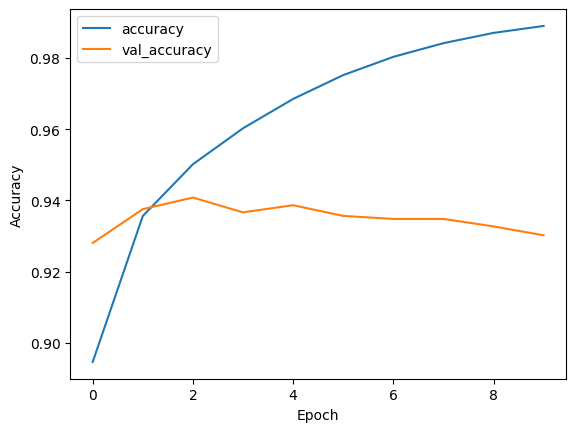

In [ ]:
import matplotlib.pyplot as plt

plt.plot(history.history['accuracy'], label='accuracy')
plt.plot(history.history['val_accuracy'], label='val_accuracy')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.legend()
plt.show()

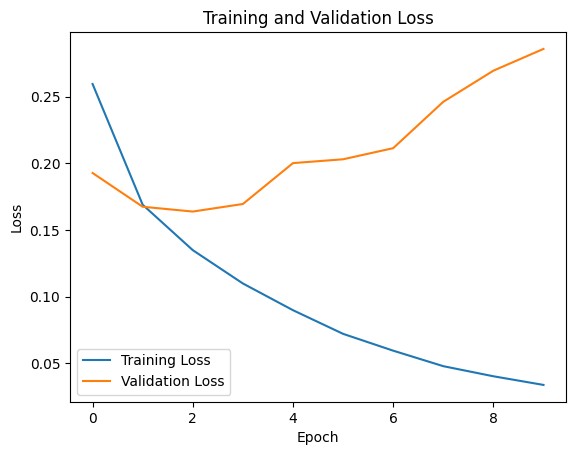

In [ ]:
# Tracer les courbes de loss
plt.plot(history.history['loss'], label='Training Loss')
plt.plot(history.history['val_loss'], label='Validation Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.title('Training and Validation Loss')
plt.legend()
plt.show()

L’accuracy sur l’ensemble d’entraînement a augmenté de manière constante au fil des époques, Cela indique que le modèle apprend efficacement à partir des données d’entraînement.
Augmentation de val_los peut être un signe de overfitting. Cela signifie que le modèle pourrait apprendre des détails spécifiques à l’ensemble d’entraînement qui ne se généralisent pas bien aux nouvelles données.
Malgré l’augmentation de la perte de validation, l’accuracy de validation reste relativement stable et élevée Cela suggère que le modèle conserve une bonne capacité de généralisation sur l’ensemble de test.
Pour contrer le surajustement potentiel, nous pourrions  envisager appliquer la technique de dropoutou la régularisation L1/L2


Nous allons utiliser la technique de dropout pour réduire l'overfiting

In [ ]:
# Définir les dimensions
vocab_size = 10000  # Taille du vocabulaire
embed_dim = 64  # Dimension de l'embedding
lstm_out = 200  # Longueur maximale d'une critique
num_classes = 2  # Nombre de classes (positive/négative)

# Créer le modèle
model = Sequential()
model.add(Embedding(vocab_size, embed_dim, input_length=lstm_out))
model.add(Dropout(0.8))  # Ajouter un dropout
model.add(LSTM(lstm_out, dropout=0.2, recurrent_dropout=0.2))
model.add(Dense(num_classes, activation='softmax'))

# Compiler le modèle
model.compile(loss='categorical_crossentropy', optimizer='adamax', metrics=['accuracy'])

# Afficher le résumé du modèle
print(model.summary())



Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 embedding (Embedding)       (None, 200, 64)           640000    
                                                                 
 dropout (Dropout)           (None, 200, 64)           0         
                                                                 
 lstm (LSTM)                 (None, 200)               212000    
                                                                 
 dense (Dense)               (None, 2)                 402       
                                                                 
Total params: 852402 (3.25 MB)
Trainable params: 852402 (3.25 MB)
Non-trainable params: 0 (0.00 Byte)
_________________________________________________________________
None


In [ ]:
# Entraîner le modèle (assurez-vous d'avoir défini X_train et y_train auparavant)
history = model.fit(X_train, y_train, epochs=5, batch_size=64, validation_data=(X_test, y_test), verbose=1)

# Évaluer le modèle (assurez-vous d'avoir défini X_test et y_test auparavant)
score, acc = model.evaluate(X_test, y_test, verbose=2, batch_size=32)
print("score: %.2f" % (score))
print("accuracy: %.2f" % (acc))


Epoch 1/5
2500/2500 [==============================] - 4246s 2s/step - loss: 0.6768 - accuracy: 0.5529 - val_loss: 0.6357 - val_accuracy: 0.6366
Epoch 2/5
2500/2500 [==============================] - 3977s 2s/step - loss: 0.6428 - accuracy: 0.6571 - val_loss: 0.6156 - val_accuracy: 0.6976
Epoch 3/5
2500/2500 [==============================] - 4002s 2s/step - loss: 0.6341 - accuracy: 0.6661 - val_loss: 0.5957 - val_accuracy: 0.7079
Epoch 4/5
2500/2500 [==============================] - ETA: 0s - loss: 0.6263 - accuracy: 0.6555

In [ ]:
import matplotlib.pyplot as plt

plt.plot(history.history['accuracy'], label='accuracy')
plt.plot(history.history['val_accuracy'], label='val_accuracy')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.legend()
plt.show()

NameError: name 'history' is not defined

In [ ]:
from sklearn.metrics import confusion_matrix
from keras.utils import to_categorical
y_val = to_categorical(df_val['label'])
# Prédiction sur les données de validation pour le modèle
y_pred = model.predict(X_val)
y_pred = (y_pred > 0.5).astype('int')  # Conversion en classes
conf_matrix_ = confusion_matrix(y_val, y_pred)
print("Matrice de confusion pour le modèle RMSprop :\n", conf_matrix)

AttributeError: 'KeyedVectors' object has no attribute 'predict'

## CNN combined LSTM

In [ ]:
cnn_lstm_model = Sequential()
cnn_lstm_model.add(Embedding(input_dim = vocab_size, output_dim = embedding_dim, input_length=max_length))
cnn_lstm_model.add(Conv1D(filters=32, kernel_size=5, padding='same', activation='relu'))
cnn_lstm_model.add(MaxPooling1D(pool_size=2))
cnn_lstm_model.add(Conv1D(filters=32, kernel_size=3, padding='same', activation='relu'))
cnn_lstm_model.add(MaxPooling1D(pool_size=2))
cnn_lstm_model.add(Bidirectional(LSTM(128, return_sequences=True)))
cnn_lstm_model.add(Dropout(0.2))
cnn_lstm_model.add(Bidirectional(LSTM(64)))
cnn_lstm_model.add(Dense(num_classes, activation='softmax'))
cnn_lstm_model.summary()

Model: "sequential_3"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 embedding_3 (Embedding)     (None, 200, 64)           640000    
                                                                 
 conv1d_2 (Conv1D)           (None, 200, 32)           10272     
                                                                 
 max_pooling1d_2 (MaxPoolin  (None, 100, 32)           0         
 g1D)                                                            
                                                                 
 conv1d_3 (Conv1D)           (None, 100, 32)           3104      
                                                                 
 max_pooling1d_3 (MaxPoolin  (None, 50, 32)            0         
 g1D)                                                            
                                                                 
 bidirectional_4 (Bidirecti  (None, 50, 256)          

In [ ]:
# Compiler le modèle
cnn_lstm_model.compile(loss='categorical_crossentropy', optimizer='adam', metrics=['accuracy'])
# Entraîner le modèle
history = cnn_lstm_model.fit(X_train, y_train, epochs=10, batch_size=64, validation_data=(X_test, y_test), verbose=1)

# Évaluer le modèle sur les données de test
test_loss, test_accuracy = cnn_lstm_model.evaluate(X_test, y_test, verbose=1)
print("Test Accuracy:", test_accuracy)

Epoch 1/10
2500/2500 [==============================] - 107s 38ms/step - loss: 0.2124 - accuracy: 0.9123 - val_loss: 0.1727 - val_accuracy: 0.9287
Epoch 2/10
2500/2500 [==============================] - 46s 19ms/step - loss: 0.1346 - accuracy: 0.9488 - val_loss: 0.1586 - val_accuracy: 0.9397
Epoch 3/10
2500/2500 [==============================] - 44s 17ms/step - loss: 0.0968 - accuracy: 0.9651 - val_loss: 0.1823 - val_accuracy: 0.9395
Epoch 4/10
2500/2500 [==============================] - 43s 17ms/step - loss: 0.0644 - accuracy: 0.9779 - val_loss: 0.1914 - val_accuracy: 0.9387
Epoch 5/10
2500/2500 [==============================] - 43s 17ms/step - loss: 0.0435 - accuracy: 0.9863 - val_loss: 0.2252 - val_accuracy: 0.9334
Epoch 6/10
2500/2500 [==============================] - 42s 17ms/step - loss: 0.0319 - accuracy: 0.9897 - val_loss: 0.2433 - val_accuracy: 0.9373
Epoch 7/10
2500/2500 [==============================] - 42s 17ms/step - loss: 0.0256 - accuracy: 0.9920 - val_loss: 0.2615 

L'expérimentation avec le cnn combiné avec le LSTM donne une accuracy de 0.93, ce qui indique que le modèle apprend efficacement à partir des données d’entraînement.
Malgré l’amélioration de la précision, la perte de validation augmente. Cela peut indiquer un surajustement (overfitting), où le modèle apprend trop bien les détails de l’ensemble d’entraînement au point de perdre en généralisation sur de nouvelles données.